In [1]:
import pandas as pd

# Read edge data
edges_df = pd.read_csv('rifter_arcstra_li.csv', delimiter=';')

# Read node data
nodes_df = pd.read_csv('rifter_nodi_pt.csv', delimiter=';')

# Read area data
areas_df = pd.read_csv('aree-stradali.csv', delimiter=';')

nodes_df

,CODICE,Geo Point,Geo Shape
0,17294,"44.49971742821927, 11.35936855274947","{""coordinates"": [11.35936855274947, 44.4997174..."
1,17302,"44.508273901156386, 11.364877337214907","{""coordinates"": [11.364877337214907, 44.508273..."
2,17312,"44.51038720501869, 11.28579491311659","{""coordinates"": [11.28579491311659, 44.5103872..."
3,17317,"44.49938190042942, 11.39487140943916","{""coordinates"": [11.39487140943916, 44.4993819..."
4,17319,"44.499269079912985, 11.39496839856179","{""coordinates"": [11.39496839856179, 44.4992690..."
...,...,...,...
6032,6922,"44.481197610464584, 11.388892795460562","{""coordinates"": [11.388892795460562, 44.481197..."
6033,6890,"44.484174202237156, 11.38022343124339","{""coordinates"": [11.38022343124339, 44.4841742..."
6034,6917,"44.484155885519726, 11.38974677072629","{""coordinates"": [11.38974677072629, 44.4841558..."
6035,6928,"44.48827405086132, 11.385475218228926","{""coordinates"": [11.385475218228926, 44.488274..."


In [2]:
import networkx as nx

# Create a graph
G = nx.Graph()

list1 = list()

# Add nodes to the graph
for _, node_row in nodes_df.iterrows():
    G.add_node(node_row['CODICE'], pos=eval(node_row['Geo Point']))

# Add edges to the graph
for _, edge_row in edges_df.iterrows():
    G.add_edge(edge_row['COD_NODO1'], edge_row['COD_NODO2'], weight=edge_row['LUNGHEZ'])
    edge1 = edge_row['COD_NODO1']
    edge2 = edge_row['COD_NODO2']
    weight = edge_row['LUNGHEZ']

    list1.append([edge1, edge2, weight])

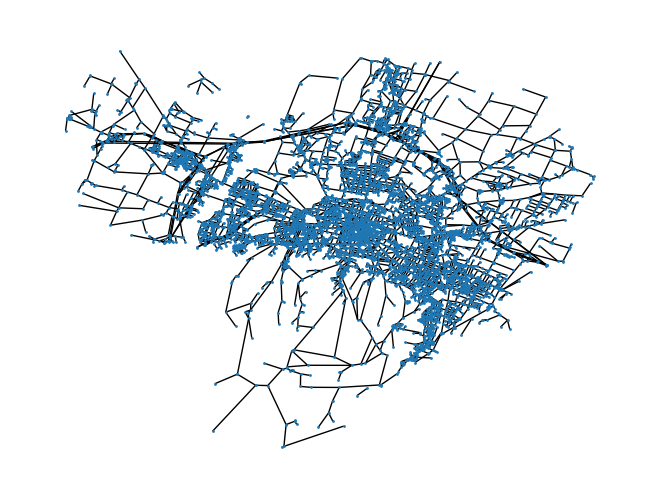

In [3]:
import matplotlib.pyplot as plt

# Draw the graph
pos = nx.get_node_attributes(G, 'pos')
pos_inverted = {node: (y, x) for node, (x, y) in pos.items()}
nx.draw(G, pos_inverted, with_labels=False, node_size=1, font_size=8, font_color='black')
plt.show()

In [4]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming G is your graph
# pos = nx.get_node_attributes(G, 'pos')

# Create a figure and specify the size (adjust the numbers as needed)
plt.figure(figsize=(100, 80))


node_labels = {13517: 'Piazza Malpighi', 13541: 'Due Torri', 6304: 'Porta Santo Stefano', 16954: 'West suburb - Borgo Panigale', 5747: 'South suburb - Savena'}

# Draw the graph
nx.draw(G, pos_inverted, with_labels=False, node_size=100,node_color='lightgray', edge_color='lightgray', font_size=8, font_color='black')
nx.draw_networkx_nodes(G, pos_inverted, nodelist=[13517,13541,6304,16954,5747], node_color=['red','blue','green','purple','orange'], node_size=1000)
nx.draw_networkx_labels(G, pos_inverted, labels=node_labels, font_size=80, font_color='black', verticalalignment="bottom", horizontalalignment="left", bbox=dict(facecolor='none', edgecolor='none', boxstyle='round,pad=0.2'))

# # Invert the y-axis
# plt.gca().invert_xaxis()

# # Invert the y-axis
# plt.gca().invert_yaxis()

# Show the plot
plt.show()

In [5]:
#calculate data

import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
from pandas import DataFrame
import numpy as np

def create_subgraph_and_mesures(node, direction,color):

  # converting values of sliding from meters to degrees
  sliding_values_m = [0, 50, 100, 200, 300, 500, 1000, 1500]
  coefficent_meter_to_degree = 111139
  sliding_values_degree = []
  for value_m in sliding_values_m:
      values_deg = value_m / coefficent_meter_to_degree
      sliding_values_degree.append(values_deg)


  data = {'Unit':[], 'Distance between red chosen node and center node (m)':[], 'Closeness centrality of the red chosen node 1/km':[], 'Average distance from all nodes to chosen node':[], 'average edges length':[], 'Total nodes number':[], 'Normalized closeness centrality 1/km':[], 'std':[]}  #'BC(v)':[]
  avarage_shortest_path = []


  case_number = 1
  for value in sliding_values_degree:

      # Specify the center node and the size of the square in meters
      center_node = node # Replace with the actual node name
      distance_in_meters = 1500
      coefficent_meter_to_degree = 111139
      square_size_meters = distance_in_meters / coefficent_meter_to_degree  # converting the distance expressed in meters into degrees

      # Calculate the bounding box for the square
      x, y = pos_inverted[center_node]

      if direction == 'y':
        xmin, xmax = x - square_size_meters , x + square_size_meters
        ymin, ymax = y - square_size_meters + value, y + square_size_meters + value
      else:
        xmin, xmax = x - square_size_meters + value , x + square_size_meters + value
        ymin, ymax = y - square_size_meters, y + square_size_meters

      # Filter nodes within the bounding box
      filtered_nodes = {node: pos_inverted[node] for node, (x, y) in pos_inverted.items() if xmin <= x <= xmax and ymin <= y <= ymax}

      # Create a subgraph with the filtered nodes
      subgraph = G.subgraph(filtered_nodes)

      # Create a figure and specify the size (adjust the numbers as needed)
      plt.figure(figsize=(3, 3))

      # Draw the subgraph
      nx.draw(subgraph, pos=filtered_nodes, with_labels=False, node_size=1, node_color='lightblue', edge_color='lightblue')
      nx.draw_networkx_edges(subgraph, pos_inverted, width=0.3, edge_color='lightblue')
      nx.draw_networkx_nodes(subgraph, pos=filtered_nodes, nodelist=[center_node], node_color=color, node_size=10)
      # Show the plot
      plt.show()



      # calculating closeness centrality with paper formula

      nodes_number = len(subgraph)

      summation_value = 0
      shortest_paths_list=[]
      no_isolated_nodes= sorted(nx.descendants(subgraph, center_node)) #uso solo i nodi collegati, non quelli isolati
      for u in no_isolated_nodes:
        shortest_path_center_point_u = nx.shortest_path_length(subgraph, source=center_node, target=u, weight='weight')
        shortest_paths_list.append(shortest_path_center_point_u)
        summation_value = summation_value + shortest_path_center_point_u

      if summation_value != 0:
        paper_closeness = (1/ summation_value) * 1000#
      else:
        paper_closeness = 0


      paper_normalized_centrality = (paper_closeness * len(no_isolated_nodes))



      #calculating avarage distance from all nodes
      if len(no_isolated_nodes) != 0:
        avarage_distance = (summation_value)/len(no_isolated_nodes)
      else:
        avarage_distance = 0

      #calculating avarage edges length
      total_weight = 0
      num_edges = 0

      for edge in subgraph.edges(data=True):
          total_weight += edge[2]['weight']
          num_edges += 1

      average_weight = total_weight / num_edges

      # # calculating betweeness centrality
      # subgraph_betweenness_centrality = nx.betweenness_centrality(subgraph, weight= 'weight')
      # node_betweennes_centrality = subgraph_betweenness_centrality[center_node]


      std_shortest_paths = np.std(shortest_paths_list)



      data['Unit'].append('Catchment area ' + str(case_number))
      data['Distance between red chosen node and center node (m)'].append(sliding_values_m[sliding_values_degree.index(value)])
      data['Closeness centrality of the red chosen node 1/km'].append(paper_closeness)
      data['Average distance from all nodes to chosen node'].append(avarage_distance)
      data['Total nodes number'].append(len(no_isolated_nodes))
      data['Normalized closeness centrality 1/km'].append(paper_normalized_centrality)
      data['std'].append(std_shortest_paths)
      data['average edges length'].append(average_weight)

      # data['BC(v)'].append(node_betweennes_centrality)




      case_number = case_number+ 1

  df= pd.DataFrame(data)

  # # Calculate percentage deviation betweenness
  # reference_betweenness = df['BC(v)'].iloc[0]  # Assuming the reference is the first row
  # df['Percentage Deviation BC(v)'] = (df['BC(v)'] / reference_betweenness) * 100

  # Calculate percentage deviation closeness
  reference_closeness = df['Normalized closeness centrality 1/km'].iloc[0]  # Assuming the reference is the first row
  df['Percentage Deviation CN(v)'] = (abs(df['Normalized closeness centrality 1/km']) / reference_closeness) * 100

  reference_std = df['std'].iloc[0]
  df['Percentage Deviation std'] = (df['std']/reference_std) * 100

  reference_number_edges = df['average edges length'].iloc[0]
  df['Percentage Deviation edges length'] = (df['average edges length']/reference_number_edges) * 100

  return df



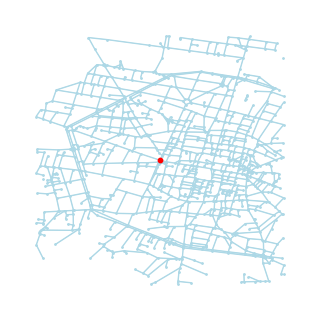

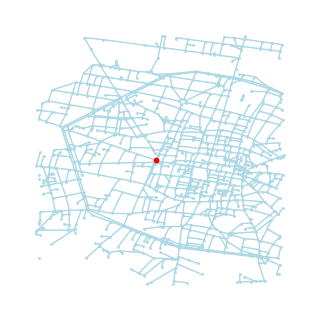

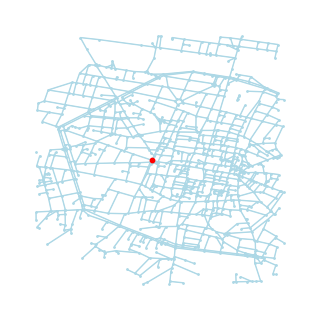

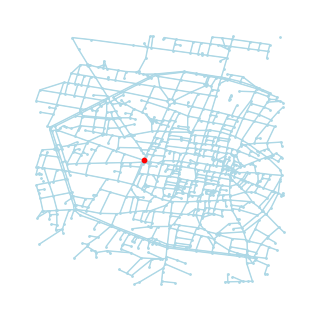

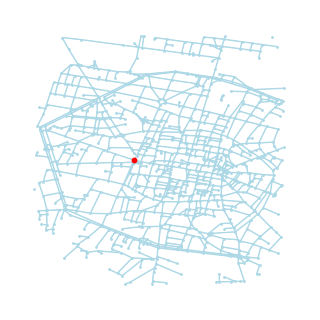

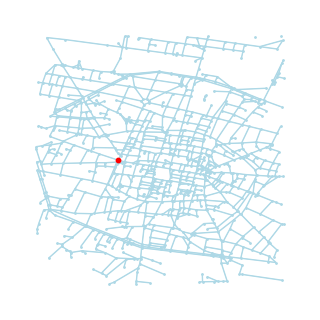

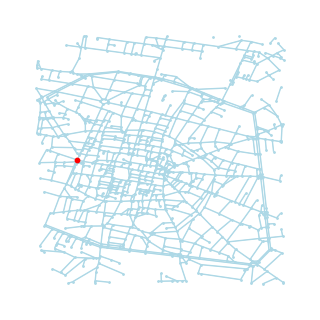

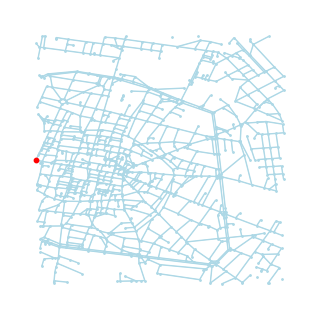

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,average edges length,Total nodes number,Normalized closeness centrality 1/km,std,Percentage Deviation CN(v),Percentage Deviation std,Percentage Deviation edges length
0,Catchment area 1,0,0.000999,997.837488,71.500000,1003,1.002167,445.434300,100.000000,100.000000,100.000000
1,Catchment area 2,50,0.000989,1002.344896,71.228276,1009,0.997661,448.671811,99.550314,100.726821,99.619966
2,Catchment area 3,100,0.000995,1000.055721,71.402624,1005,0.999944,448.205327,99.778189,100.622096,99.863810
3,Catchment area 4,200,0.000988,1004.625621,71.626117,1007,0.995396,451.891057,99.324312,101.449542,100.176387
4,Catchment area 5,300,0.000982,1013.680597,71.315681,1005,0.986504,462.250903,98.437071,103.775327,99.742211
5,Catchment area 6,500,0.000944,1048.883168,72.206589,1010,0.953395,494.827587,95.133330,111.088793,100.988236
6,Catchment area 7,1000,0.000804,1200.124517,72.627845,1036,0.833247,607.619398,83.144497,136.410554,101.577405
7,Catchment area 8,1500,0.000714,1397.797405,74.703961,1002,0.715411,701.524078,71.386417,157.492155,104.481064


In [6]:
#1. Piazza Malpighi. spostamento sud-nord
df_1 = create_subgraph_and_mesures(13517, "x", 'red')

df_1

In [7]:
mean_1 = np.mean(df_1['Percentage Deviation std'])
median_1 = np.median(df_1['Percentage Deviation std'])
median_1

102.61243464676892

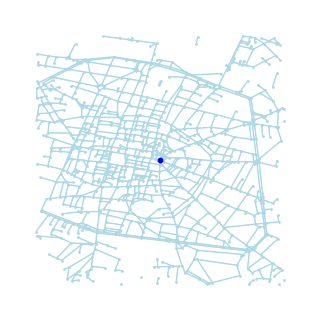

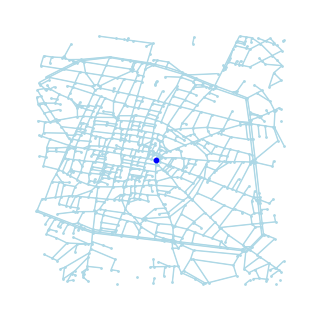

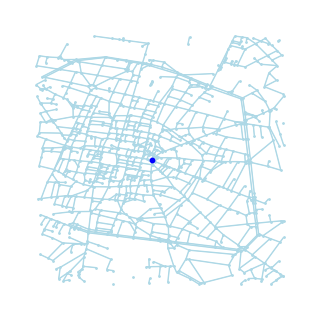

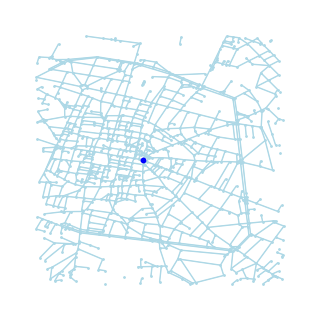

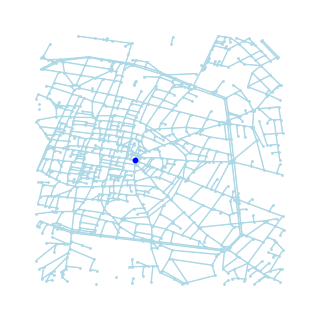

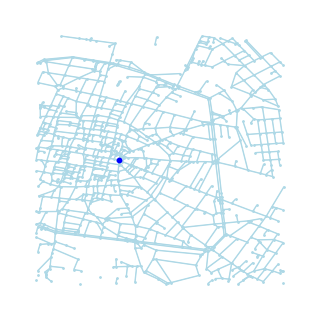

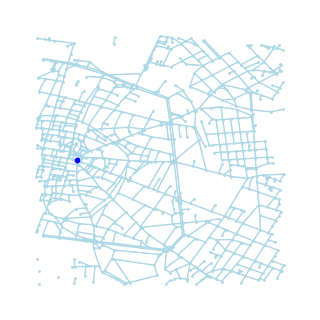

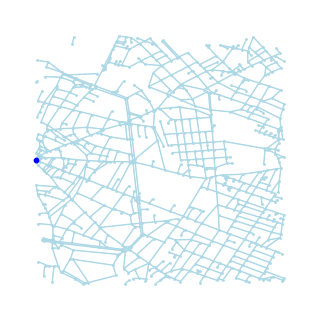

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,average edges length,Total nodes number,Normalized closeness centrality 1/km,std,Percentage Deviation CN(v),Percentage Deviation std,Percentage Deviation edges length
0,Catchment area 1,0,0.001003,976.285015,73.011580,1021,1.024291,494.536764,100.000000,100.000000,100.000000
1,Catchment area 2,50,0.001016,973.031621,73.078929,1012,1.027716,496.538991,100.334356,100.404869,100.092244
2,Catchment area 3,100,0.001005,980.006897,73.777930,1015,1.020401,504.686516,99.620219,102.052376,101.049628
3,Catchment area 4,200,0.001021,978.080919,73.615972,1001,1.022410,509.364455,99.816385,102.998299,100.827803
4,Catchment area 5,300,0.000987,997.071850,74.123448,1016,1.002937,522.010576,97.915212,105.555464,101.522865
5,Catchment area 6,500,0.000997,1009.347082,74.900844,994,0.990739,539.590963,96.724410,109.110384,102.587622
6,Catchment area 7,1000,0.000940,1162.946448,78.097918,915,0.859885,653.068820,83.949267,132.056677,106.966481
7,Catchment area 8,1500,0.000759,1557.879433,85.046769,846,0.641898,716.355924,62.667559,144.853927,116.483944


In [8]:
#2. Due torri. spostamento ovest-est
df_2 = create_subgraph_and_mesures(13541, "x", 'blue')

df_2

In [9]:
mean_2 = np.mean(df_2['Percentage Deviation std'])
median_2 = np.median(df_2['Percentage Deviation std'])
median_2

104.27688146015743

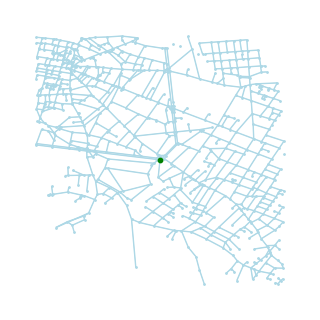

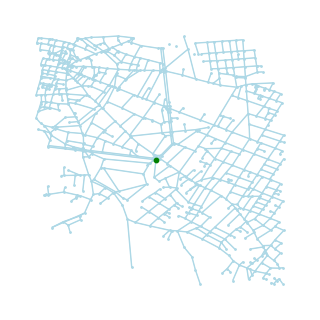

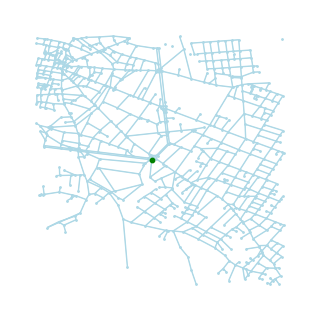

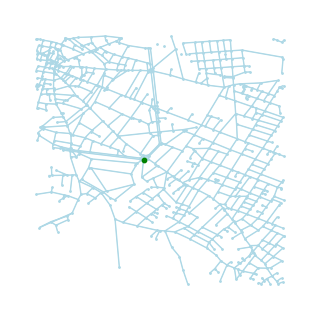

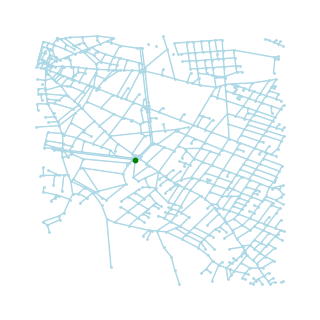

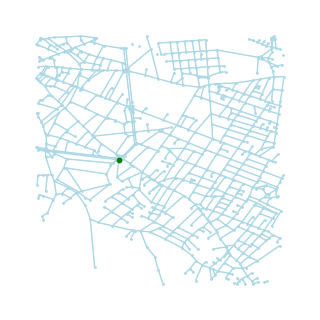

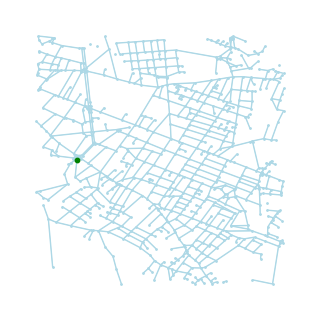

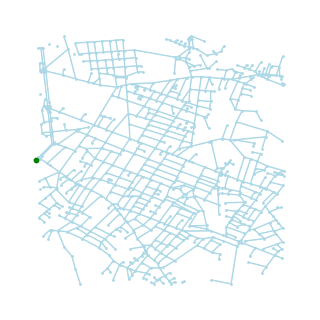

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,average edges length,Total nodes number,Normalized closeness centrality 1/km,std,Percentage Deviation CN(v),Percentage Deviation std,Percentage Deviation edges length
0,Catchment area 1,0,0.001051,1221.731707,79.414612,779,0.818510,443.240409,100.000000,100.000000,100.000000
1,Catchment area 2,50,0.001065,1217.329442,80.100368,771,0.821470,441.667534,100.361633,99.645142,100.863514
2,Catchment area 3,100,0.001052,1224.673969,80.318894,776,0.816544,446.604123,99.759751,100.758892,101.138685
3,Catchment area 4,200,0.001036,1240.622108,82.156481,778,0.806047,460.356932,98.477345,103.861679,103.452601
4,Catchment area 5,300,0.001045,1247.907432,83.048780,767,0.801341,469.587542,97.902431,105.944208,104.576196
5,Catchment area 6,500,0.000997,1314.180865,85.664129,763,0.760930,538.340576,92.965264,121.455663,107.869481
6,Catchment area 7,1000,0.000884,1496.730159,86.293189,756,0.668123,609.804827,81.626718,137.578798,108.661601
7,Catchment area 8,1500,0.000736,1717.620733,85.152445,791,0.582201,654.629462,71.129306,147.691738,107.225160


In [10]:
#3. Porta Santo Stefano. spostamento ovest-est
df_3 = create_subgraph_and_mesures(6304, "x", 'green')
df_3

In [11]:
mean_3 = np.mean(df_3['Percentage Deviation std'])
median_3 = np.median(df_3['Percentage Deviation std'])
median_3

104.9029437546483

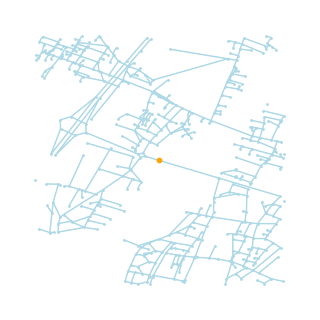

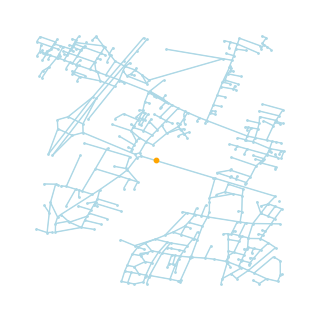

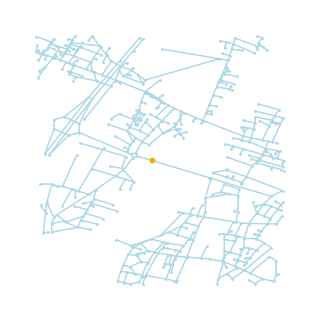

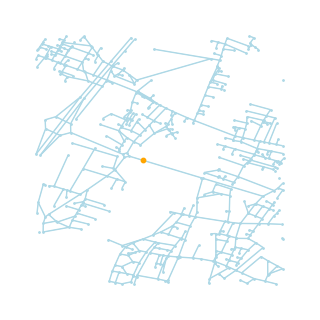

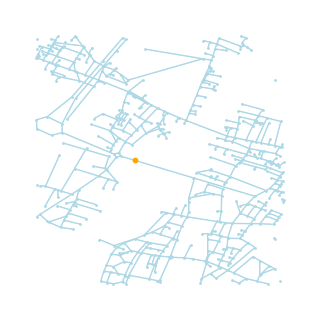

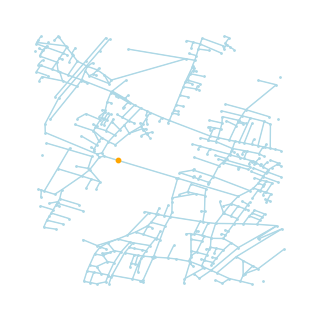

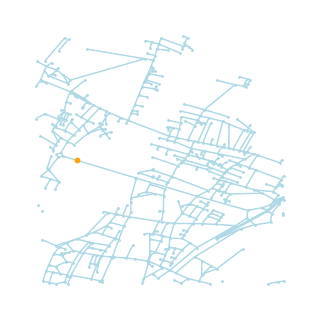

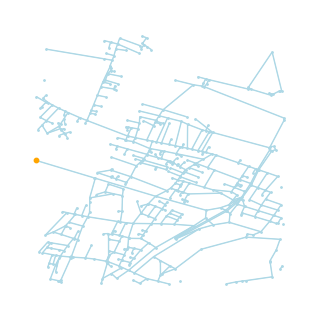

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,average edges length,Total nodes number,Normalized closeness centrality 1/km,std,Percentage Deviation CN(v),Percentage Deviation std,Percentage Deviation edges length
0,Catchment area 1,0,0.001305,1532.396000,97.324873,500,0.652573,527.801325,100.000000,100.000000,100.000000
1,Catchment area 2,50,0.001269,1541.671233,97.379139,511,0.648647,527.931307,99.398365,100.024627,100.055758
2,Catchment area 3,100,0.001265,1526.451737,98.031046,518,0.655114,509.827865,100.389417,96.594654,100.725583
3,Catchment area 4,200,0.001251,1528.592734,97.599354,523,0.654196,511.674950,100.248808,96.944613,100.282025
4,Catchment area 5,300,0.001224,1529.756554,92.696682,534,0.653699,506.532370,100.172540,95.970272,95.244596
5,Catchment area 6,500,0.001252,1530.350575,95.724026,522,0.653445,512.077473,100.133657,97.020877,98.355151
6,Catchment area 7,1000,0.001240,1593.557312,94.192496,506,0.627527,512.398323,96.161963,97.081667,96.781525
7,Catchment area 8,1500,0.000966,2175.235294,99.737391,476,0.459720,706.486435,70.447367,133.854616,102.478830


In [12]:
#4. zona ovest. spostamento ovest-est
df_4 = create_subgraph_and_mesures(16954, "x", 'orange')
df_4

In [13]:
mean_4 = np.mean(df_4['Percentage Deviation std'])
median_4 = np.median(df_4['Percentage Deviation std'])
median_4

97.05127163627327

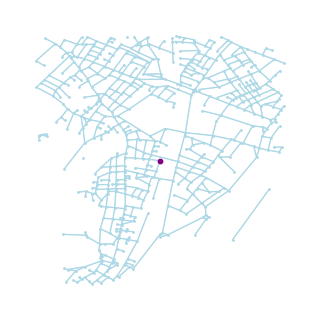

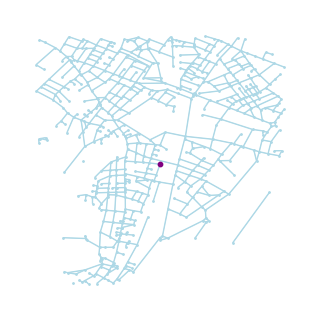

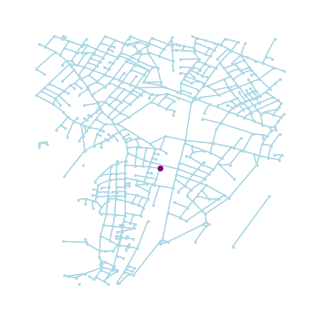

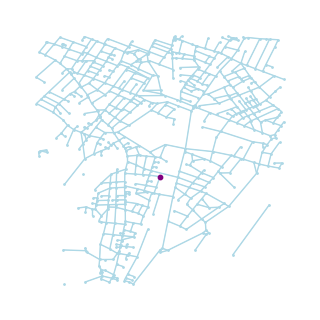

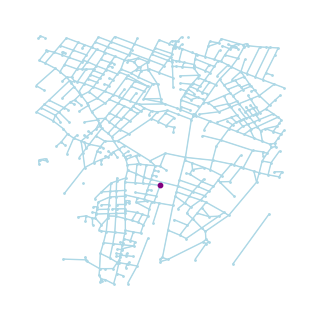

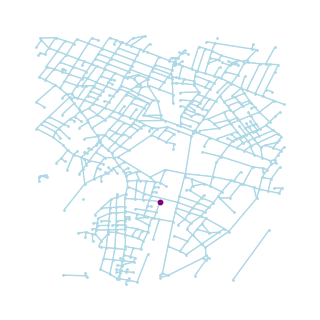

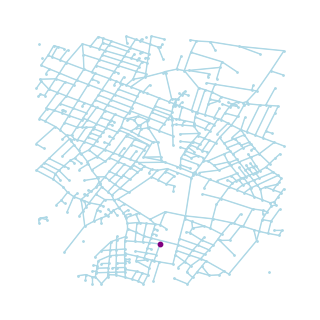

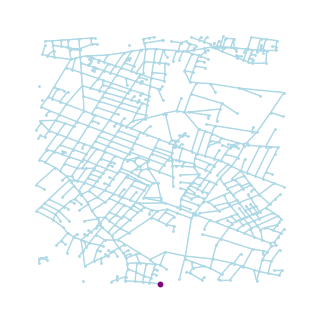

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,average edges length,Total nodes number,Normalized closeness centrality 1/km,std,Percentage Deviation CN(v),Percentage Deviation std,Percentage Deviation edges length
0,Catchment area 1,0,0.001293,1303.937605,87.607643,593,0.766908,509.639334,100.000000,100.000000,100.000000
1,Catchment area 2,50,0.001250,1320.531353,87.160891,606,0.757271,516.187603,98.743404,101.284883,99.490053
2,Catchment area 3,100,0.001215,1335.597403,87.331311,616,0.748729,524.563331,97.629540,102.928345,99.684579
3,Catchment area 4,200,0.001124,1381.655280,86.929234,644,0.723770,552.525719,94.375032,108.415046,99.225628
4,Catchment area 5,300,0.001098,1403.770416,86.777019,649,0.712367,570.344884,92.888238,111.911473,99.051882
5,Catchment area 6,500,0.001008,1466.872781,87.389130,676,0.681722,612.791610,88.892344,120.240250,99.750578
6,Catchment area 7,1000,0.000848,1666.334746,88.579167,708,0.600120,737.251153,78.251840,144.661352,101.108948
7,Catchment area 8,1500,0.000579,2201.450955,85.674352,785,0.454246,950.939254,59.230827,186.590632,97.793239


In [14]:
#5. zona ponticella. spostamento sud_ovest
df_5 = create_subgraph_and_mesures(5747, "y", 'purple')
df_5

In [15]:
mean_5 = np.mean(df_5['Percentage Deviation std'])
median_5 = np.median(df_5['Percentage Deviation std'])
median_5

110.16325934757872

In [16]:
np.mean([median_1, median_2, median_3, median_4, median_5])

103.80135816908532

In [17]:
np.mean([median_1, median_2, median_3])

103.93075328719154

In [18]:
np.median([median_1, median_2, median_3, median_4, median_5])

104.27688146015743

In [19]:
np.mean([mean_1,mean_2,mean_3,mean_4,mean_5])

112.97641776468102

In [20]:
np.median([mean_1,mean_2,mean_3,mean_4,mean_5])

113.94566108546314

<Figure size 800x600 with 0 Axes>

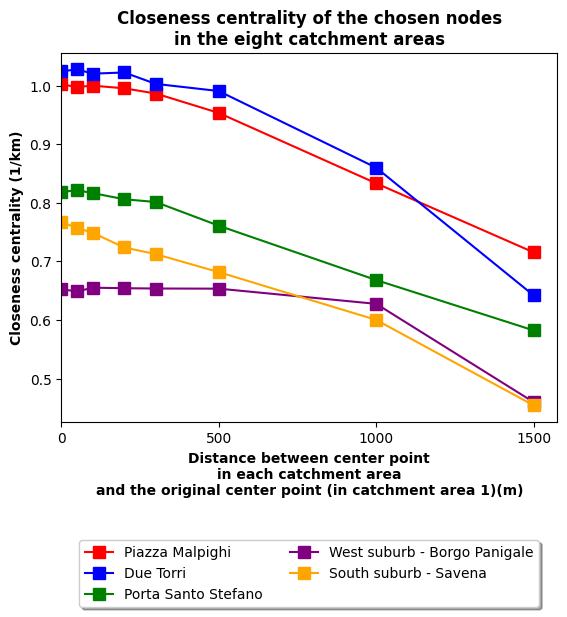

0    1.002167
1    0.997661
2    0.999944
3    0.995396
4    0.986504
5    0.953395
6    0.833247
7    0.715411
Name: Normalized closeness centrality 1/km, dtype: float64

In [21]:
# Multiply the 'Normalized closeness centrality 1/km' column by 1000
# df_1['Normalized closeness centrality 1/km'] = df_1['Normalized closeness centrality 1/km'] * 1000
# df_2['Normalized closeness centrality 1/km'] = df_2['Normalized closeness centrality 1/km'] * 1000
# df_3['Normalized closeness centrality 1/km'] = df_3['Normalized closeness centrality 1/km'] * 1000
# df_4['Normalized closeness centrality 1/km'] = df_4['Normalized closeness centrality 1/km'] * 1000
# df_5['Normalized closeness centrality 1/km'] = df_5['Normalized closeness centrality 1/km'] * 1000
plt.figure(figsize=(8, 6))

# Create a scatter plot with square markers for the blue dataset
ax = df_1.plot(x='Distance between red chosen node and center node (m)', y='Normalized closeness centrality 1/km', marker='s', markersize=8, label='Piazza Malpighi', color='red')
bx = df_2.plot(x='Distance between red chosen node and center node (m)', y='Normalized closeness centrality 1/km', marker='s', markersize=8, label='Due Torri', color='blue', ax=ax)
cx = df_3.plot(x='Distance between red chosen node and center node (m)', y='Normalized closeness centrality 1/km', marker='s', markersize=8, label='Porta Santo Stefano', color = 'green', ax=ax)
dx = df_4.plot(x='Distance between red chosen node and center node (m)', y='Normalized closeness centrality 1/km', marker='s', markersize=8, label='West suburb - Borgo Panigale', color = 'purple', ax=ax)
ex = df_5.plot(x='Distance between red chosen node and center node (m)', y='Normalized closeness centrality 1/km', marker='s', markersize=8, label='South suburb - Savena', color = 'orange', ax=ax)


# Customize the plot
plt.title('Closeness centrality of the chosen nodes\nin the eight catchment areas', weight='bold')
plt.xlabel('Distance between center point\nin each catchment area\nand the original center point (in catchment area 1)(m)', weight='bold')
plt.ylabel('Closeness centrality (1/km)', weight='bold')

# Set y-axis ticks for specific ranges
y_ticks = np.arange(0, 1, 0.1)
x_ticks = np.arange(0, 1600, 500)
ax.set_xticks(x_ticks)


# Set x-axis limits to start from 0 at the origin
ax.set_xlim(left=0)


# Show the legend
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), fancybox=True, shadow=True, ncol=2)

# Show the plot
plt.show()

df_1['Normalized closeness centrality 1/km']


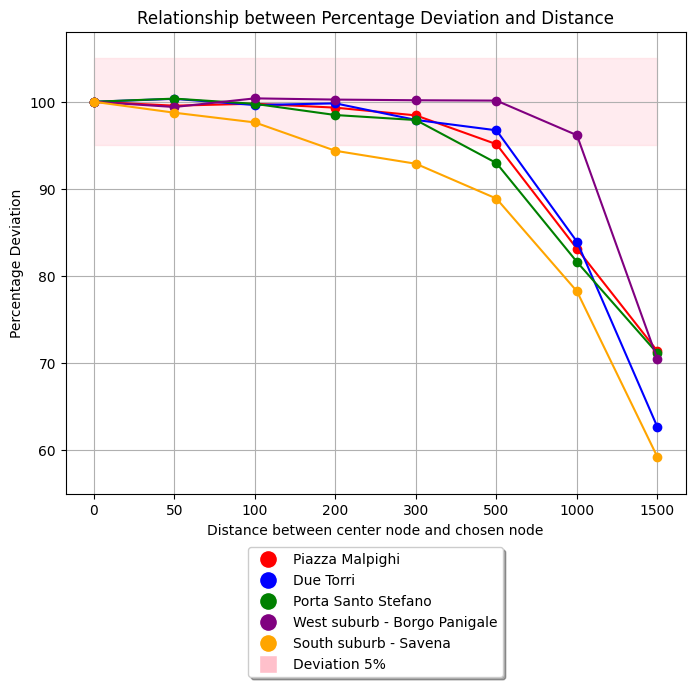

In [22]:
#deviation percentage

df = df_1
# Larger figure size
plt.figure(figsize=(8, 6))
# Plotting
equidistant_x_values = np.linspace(0, len(df['Distance between red chosen node and center node (m)']) - 1, len(df['Distance between red chosen node and center node (m)']))
ax = plt.plot(equidistant_x_values, df['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='red')
bx = plt.plot(equidistant_x_values, df_2['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='blue')
cx = plt.plot(equidistant_x_values, df_3['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='green')
dx = plt.plot(equidistant_x_values, df_4['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='purple')
ex = plt.plot(equidistant_x_values, df_5['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='orange')

# Set x-axis ticks and labels
plt.xticks(equidistant_x_values, df['Distance between red chosen node and center node (m)'])

# Set y-axis limits to emphasize the digression
plt.ylim(55, max(df['Percentage Deviation CN(v)']) + 8)  # Adjust the upper limit as needed

# Add a horizontal line at 100 with a semitransparent pink color
# plt.axhline(y=100, color='pink', linewidth=15, alpha=0.5, label='2% Line', zorder=13)
plt.fill_between(equidistant_x_values, 95, 105, color='pink', alpha=0.3, label='Daviation 5%')

# Add a legend with a pink square
# legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=10, label='Deviation 2%')]
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=13, label='Piazza Malpighi'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=13, label='Due Torri'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=13, label='Porta Santo Stefano'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=13, label='West suburb - Borgo Panigale'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=13, label='South suburb - Savena'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=13, label='Deviation 5%'),
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

# Add labels and title
plt.xlabel('Distance between center node and chosen node')
plt.ylabel('Percentage Deviation')
plt.title('Relationship between Percentage Deviation and Distance')
plt.grid(True)

# df_n_nodes = DataFrame({'Area1':df_1['total nodes numebr'], 'Area2':df_2['total nodes numebr'],'Area3':df_3['total nodes numebr'], 'Area4':df_4['total nodes numebr'], 'Area5':df_5['total nodes numebr']})
# df_n_nodes
# df_final = DataFrame({'area1':df_1['Percentage Deviation CN(v)'],'area2':df_2['Percentage Deviation CN(v)'], 'area3':df_3['Percentage Deviation CN(v)'], 'area4':df_4['Percentage Deviation CN(v)'], 'area5':df_5['Percentage Deviation CN(v)']})
# df_final


# Tabelle Delle 8 catchement areas

In [23]:
erica_1 = df_1[['Unit','Distance between red chosen node and center node (m)', 'Closeness centrality of the red chosen node 1/km', 'Average distance from all nodes to chosen node', 'Total nodes number', 'Normalized closeness centrality 1/km' ]]
erica_1

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,Total nodes number,Normalized closeness centrality 1/km
0,Catchment area 1,0,0.000999,997.837488,1003,1.002167
1,Catchment area 2,50,0.000989,1002.344896,1009,0.997661
2,Catchment area 3,100,0.000995,1000.055721,1005,0.999944
3,Catchment area 4,200,0.000988,1004.625621,1007,0.995396
4,Catchment area 5,300,0.000982,1013.680597,1005,0.986504
5,Catchment area 6,500,0.000944,1048.883168,1010,0.953395
6,Catchment area 7,1000,0.000804,1200.124517,1036,0.833247
7,Catchment area 8,1500,0.000714,1397.797405,1002,0.715411


In [24]:
erica_2 = df_2[['Unit','Distance between red chosen node and center node (m)', 'Closeness centrality of the red chosen node 1/km', 'Average distance from all nodes to chosen node', 'Total nodes number', 'Normalized closeness centrality 1/km' ]]
erica_2

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,Total nodes number,Normalized closeness centrality 1/km
0,Catchment area 1,0,0.001003,976.285015,1021,1.024291
1,Catchment area 2,50,0.001016,973.031621,1012,1.027716
2,Catchment area 3,100,0.001005,980.006897,1015,1.020401
3,Catchment area 4,200,0.001021,978.080919,1001,1.022410
4,Catchment area 5,300,0.000987,997.071850,1016,1.002937
5,Catchment area 6,500,0.000997,1009.347082,994,0.990739
6,Catchment area 7,1000,0.000940,1162.946448,915,0.859885
7,Catchment area 8,1500,0.000759,1557.879433,846,0.641898


In [25]:
erica_3 = df_3[['Unit','Distance between red chosen node and center node (m)', 'Closeness centrality of the red chosen node 1/km', 'Average distance from all nodes to chosen node', 'Total nodes number', 'Normalized closeness centrality 1/km' ]]
erica_3

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,Total nodes number,Normalized closeness centrality 1/km
0,Catchment area 1,0,0.001051,1221.731707,779,0.818510
1,Catchment area 2,50,0.001065,1217.329442,771,0.821470
2,Catchment area 3,100,0.001052,1224.673969,776,0.816544
3,Catchment area 4,200,0.001036,1240.622108,778,0.806047
4,Catchment area 5,300,0.001045,1247.907432,767,0.801341
5,Catchment area 6,500,0.000997,1314.180865,763,0.760930
6,Catchment area 7,1000,0.000884,1496.730159,756,0.668123
7,Catchment area 8,1500,0.000736,1717.620733,791,0.582201


In [26]:
erica_4 = df_4[['Unit','Distance between red chosen node and center node (m)', 'Closeness centrality of the red chosen node 1/km', 'Average distance from all nodes to chosen node', 'Total nodes number', 'Normalized closeness centrality 1/km' ]]
erica_4

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,Total nodes number,Normalized closeness centrality 1/km
0,Catchment area 1,0,0.001305,1532.396000,500,0.652573
1,Catchment area 2,50,0.001269,1541.671233,511,0.648647
2,Catchment area 3,100,0.001265,1526.451737,518,0.655114
3,Catchment area 4,200,0.001251,1528.592734,523,0.654196
4,Catchment area 5,300,0.001224,1529.756554,534,0.653699
5,Catchment area 6,500,0.001252,1530.350575,522,0.653445
6,Catchment area 7,1000,0.001240,1593.557312,506,0.627527
7,Catchment area 8,1500,0.000966,2175.235294,476,0.459720


In [27]:
erica_5 = df_5[['Unit','Distance between red chosen node and center node (m)', 'Closeness centrality of the red chosen node 1/km', 'Average distance from all nodes to chosen node', 'Total nodes number', 'Normalized closeness centrality 1/km' ]]
erica_5

,Unit,Distance between red chosen node and center node (m),Closeness centrality of the red chosen node 1/km,Average distance from all nodes to chosen node,Total nodes number,Normalized closeness centrality 1/km
0,Catchment area 1,0,0.001293,1303.937605,593,0.766908
1,Catchment area 2,50,0.001250,1320.531353,606,0.757271
2,Catchment area 3,100,0.001215,1335.597403,616,0.748729
3,Catchment area 4,200,0.001124,1381.655280,644,0.723770
4,Catchment area 5,300,0.001098,1403.770416,649,0.712367
5,Catchment area 6,500,0.001008,1466.872781,676,0.681722
6,Catchment area 7,1000,0.000848,1666.334746,708,0.600120
7,Catchment area 8,1500,0.000579,2201.450955,785,0.454246


In [28]:
df_CN_Percentage = DataFrame({'Unit':df_1['Unit'],'Piazza Malpighi Closeness Centrality':df_1['Normalized closeness centrality 1/km'], 'Piazza Malpighi Percentage Deviation':df_1['Percentage Deviation CN(v)'],'Due Torri Closeness Centrality':df_2['Normalized closeness centrality 1/km'], 'Due Torri Percentage Deviation':df_2['Percentage Deviation CN(v)'],'Porta Santo Stefano Closeness Centrality':df_3['Normalized closeness centrality 1/km'], 'Porta Santo Stefano Percentage Deviation':df_3['Percentage Deviation CN(v)'], 'Porta Santo Stefano Closeness Centrality':df_3['Normalized closeness centrality 1/km'], 'West Periphery Percentage Deviation':df_4['Percentage Deviation CN(v)'], 'West Periphery Closeness Centrality':df_4['Normalized closeness centrality 1/km'], 'South Periphery Percentage Deviation':df_5['Percentage Deviation CN(v)'],})
df_CN_Percentage

,Unit,Piazza Malpighi Closeness Centrality,Piazza Malpighi Percentage Deviation,Due Torri Closeness Centrality,Due Torri Percentage Deviation,Porta Santo Stefano Closeness Centrality,Porta Santo Stefano Percentage Deviation,West Periphery Percentage Deviation,West Periphery Closeness Centrality,South Periphery Percentage Deviation
0,Catchment area 1,1.002167,100.000000,1.024291,100.000000,0.818510,100.000000,100.000000,0.652573,100.000000
1,Catchment area 2,0.997661,99.550314,1.027716,100.334356,0.821470,100.361633,99.398365,0.648647,98.743404
2,Catchment area 3,0.999944,99.778189,1.020401,99.620219,0.816544,99.759751,100.389417,0.655114,97.629540
3,Catchment area 4,0.995396,99.324312,1.022410,99.816385,0.806047,98.477345,100.248808,0.654196,94.375032
4,Catchment area 5,0.986504,98.437071,1.002937,97.915212,0.801341,97.902431,100.172540,0.653699,92.888238
5,Catchment area 6,0.953395,95.133330,0.990739,96.724410,0.760930,92.965264,100.133657,0.653445,88.892344
6,Catchment area 7,0.833247,83.144497,0.859885,83.949267,0.668123,81.626718,96.161963,0.627527,78.251840
7,Catchment area 8,0.715411,71.386417,0.641898,62.667559,0.582201,71.129306,70.447367,0.459720,59.230827


In [29]:
import pandas as pd

# Assuming you have DataFrames df_1, df_2, df_3, df_4, df_5 already defined

# Creating the original DataFrame
df = pd.DataFrame({
    'Piazza Malpighi': df_1['Percentage Deviation std'],
    'Due Torri': df_2['Percentage Deviation std'],
    'Porta Santo Stefano': df_3['Percentage Deviation std'],
    'West periphery': df_4['Percentage Deviation std'],
    'South periphery': df_5['Percentage Deviation std']
})

# Add a final row with the mean of each column
median_row = df.median(axis=0)
df = df.append(median_row, ignore_index=True)

# Add a final row with the absolute value of the median - 100
abs_median_row = abs(median_row - 100)
df = df.append(abs_median_row, ignore_index=True)

# Add a final column with the mean of each row
df['Mean of each row'] = df.mean(axis=1)
df.insert(0, 'unit', ['Catchment area 1', 'Catchment area 2', 'Catchment area 3', 'Catchment area 4', 'Catchment area 5', 'Catchment area 6', 'Catchment area 7', 'Catchment area 8', 'Median', 'Deviation of absolute values'])

# 103.801358

df

<ipython-input-29-78d3c27c0778>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(median_row, ignore_index=True)
<ipython-input-29-78d3c27c0778>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(abs_median_row, ignore_index=True)


,unit,Piazza Malpighi,Due Torri,Porta Santo Stefano,West periphery,South periphery,Mean of each row
0,Catchment area 1,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,Catchment area 2,100.726821,100.404869,99.645142,100.024627,101.284883,100.417268
2,Catchment area 3,100.622096,102.052376,100.758892,96.594654,102.928345,100.591272
3,Catchment area 4,101.449542,102.998299,103.861679,96.944613,108.415046,102.733836
4,Catchment area 5,103.775327,105.555464,105.944208,95.970272,111.911473,104.631349
5,Catchment area 6,111.088793,109.110384,121.455663,97.020877,120.240250,111.783193
6,Catchment area 7,136.410554,132.056677,137.578798,97.081667,144.661352,129.557810
7,Catchment area 8,157.492155,144.853927,147.691738,133.854616,186.590632,154.096613
8,Median,102.612435,104.276881,104.902944,97.051272,110.163259,103.801358
9,Deviation of absolute values,2.612435,4.276881,4.902944,2.948728,10.163259,4.980850


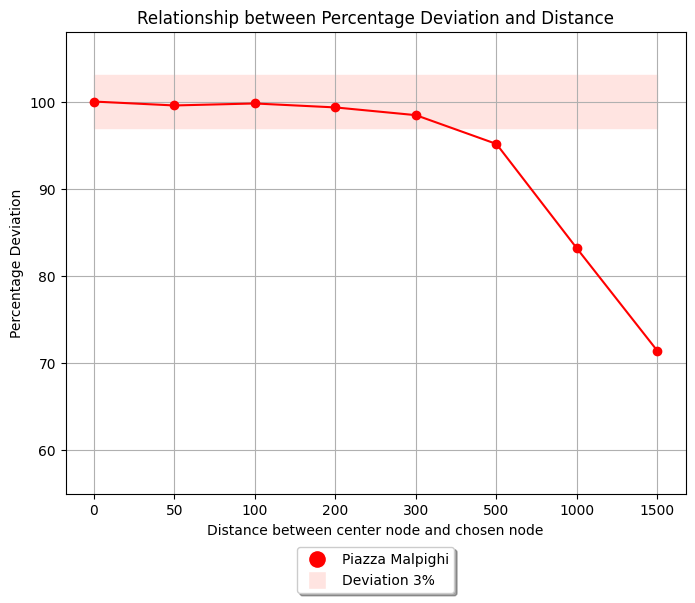

In [30]:
#deviation percentage

df = df_1
# Larger figure size
plt.figure(figsize=(8, 6))
# Plotting
equidistant_x_values = np.linspace(0, len(df['Distance between red chosen node and center node (m)']) - 1, len(df['Distance between red chosen node and center node (m)']))
ax = plt.plot(equidistant_x_values, df['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='red')


# Set x-axis ticks and labels
plt.xticks(equidistant_x_values, df['Distance between red chosen node and center node (m)'])

# Set y-axis limits to emphasize the digression
plt.ylim(55, max(df['Percentage Deviation CN(v)']) + 8)  # Adjust the upper limit as needed

# Add a horizontal line at 100 with a semitransparent pink color
# plt.axhline(y=100, color='pink', linewidth=15, alpha=0.5, label='2% Line', zorder=13)
plt.fill_between(equidistant_x_values, 97, 103, color='mistyrose')




# Add a legend with a pink square
# legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=10, label='Deviation 2%')]
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=13, label='Piazza Malpighi'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='mistyrose', markersize=13, label='Deviation 3%'),
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

# Add labels and title
plt.xlabel('Distance between center node and chosen node')
plt.ylabel('Percentage Deviation')
plt.title('Relationship between Percentage Deviation and Distance')
plt.grid(True)

# df_n_nodes = DataFrame({'Area1':df_1['total nodes numebr'], 'Area2':df_2['total nodes numebr'],'Area3':df_3['total nodes numebr'], 'Area4':df_4['total nodes numebr'], 'Area5':df_5['total nodes numebr']})
# df_n_nodes
# df_final = DataFrame({'area1':df_1['Percentage Deviation CN(v)'],'area2':df_2['Percentage Deviation CN(v)'], 'area3':df_3['Percentage Deviation CN(v)'], 'area4':df_4['Percentage Deviation CN(v)'], 'area5':df_5['Percentage Deviation CN(v)']})
# df_final

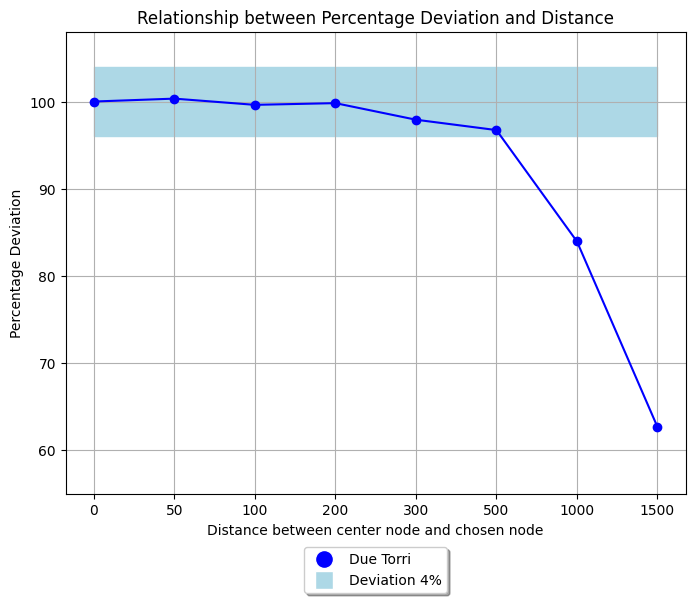

In [31]:
#deviation percentage

df = df_1
# Larger figure size
plt.figure(figsize=(8, 6))
# Plotting
equidistant_x_values = np.linspace(0, len(df['Distance between red chosen node and center node (m)']) - 1, len(df['Distance between red chosen node and center node (m)']))
ax = plt.plot(equidistant_x_values, df_2['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='blue')


# Set x-axis ticks and labels
plt.xticks(equidistant_x_values, df['Distance between red chosen node and center node (m)'])

# Set y-axis limits to emphasize the digression
plt.ylim(55, max(df['Percentage Deviation CN(v)']) + 8)  # Adjust the upper limit as needed

# Add a horizontal line at 100 with a semitransparent pink color
# plt.axhline(y=100, color='pink', linewidth=15, alpha=0.5, label='2% Line', zorder=13)

plt.fill_between(equidistant_x_values, 96, 104, color='lightblue')





# Add a legend with a pink square
# legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=10, label='Deviation 2%')]
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=13, label='Due Torri'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightblue', markersize=13, label='Deviation 4%'),

]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

# Add labels and title
plt.xlabel('Distance between center node and chosen node')
plt.ylabel('Percentage Deviation')
plt.title('Relationship between Percentage Deviation and Distance')
plt.grid(True)

# df_n_nodes = DataFrame({'Area1':df_1['total nodes numebr'], 'Area2':df_2['total nodes numebr'],'Area3':df_3['total nodes numebr'], 'Area4':df_4['total nodes numebr'], 'Area5':df_5['total nodes numebr']})
# df_n_nodes
# df_final = DataFrame({'area1':df_1['Percentage Deviation CN(v)'],'area2':df_2['Percentage Deviation CN(v)'], 'area3':df_3['Percentage Deviation CN(v)'], 'area4':df_4['Percentage Deviation CN(v)'], 'area5':df_5['Percentage Deviation CN(v)']})
# df_final

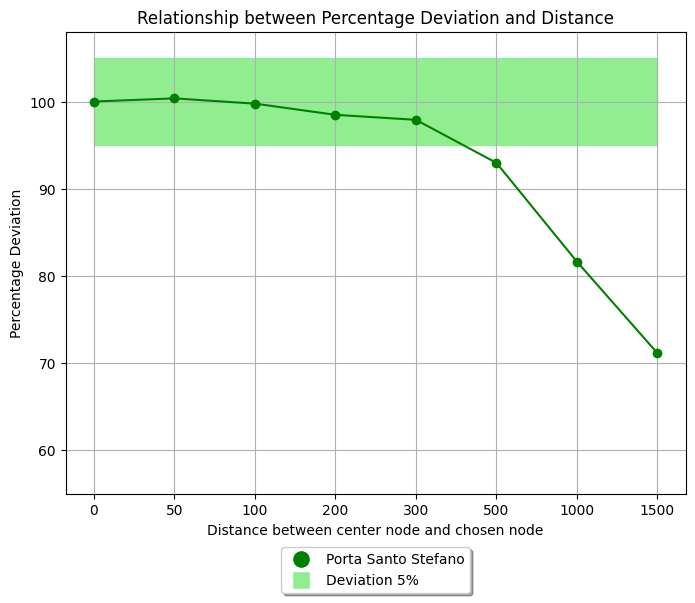

In [32]:
#deviation percentage

df = df_1
# Larger figure size
plt.figure(figsize=(8, 6))
# Plotting
equidistant_x_values = np.linspace(0, len(df['Distance between red chosen node and center node (m)']) - 1, len(df['Distance between red chosen node and center node (m)']))

cx = plt.plot(equidistant_x_values, df_3['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='green')


# Set x-axis ticks and labels
plt.xticks(equidistant_x_values, df['Distance between red chosen node and center node (m)'])

# Set y-axis limits to emphasize the digression
plt.ylim(55, max(df['Percentage Deviation CN(v)']) + 8)  # Adjust the upper limit as needed

# Add a horizontal line at 100 with a semitransparent pink color
# plt.axhline(y=100, color='pink', linewidth=15, alpha=0.5, label='2% Line', zorder=13)

plt.fill_between(equidistant_x_values, 95, 105, color='lightgreen')




# Add a legend with a pink square
# legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=10, label='Deviation 2%')]
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=13, label='Porta Santo Stefano'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='lightgreen', markersize=13, label='Deviation 5%'),

]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

# Add labels and title
plt.xlabel('Distance between center node and chosen node')
plt.ylabel('Percentage Deviation')
plt.title('Relationship between Percentage Deviation and Distance')
plt.grid(True)

# df_n_nodes = DataFrame({'Area1':df_1['total nodes numebr'], 'Area2':df_2['total nodes numebr'],'Area3':df_3['total nodes numebr'], 'Area4':df_4['total nodes numebr'], 'Area5':df_5['total nodes numebr']})
# df_n_nodes
# df_final = DataFrame({'area1':df_1['Percentage Deviation CN(v)'],'area2':df_2['Percentage Deviation CN(v)'], 'area3':df_3['Percentage Deviation CN(v)'], 'area4':df_4['Percentage Deviation CN(v)'], 'area5':df_5['Percentage Deviation CN(v)']})
# df_final

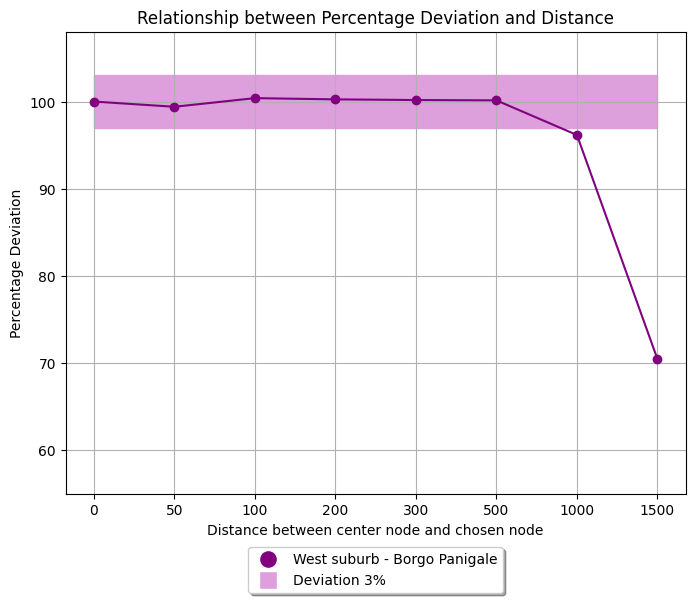

In [34]:
#deviation percentage

df = df_1
# Larger figure size
plt.figure(figsize=(8, 6))
# Plotting
equidistant_x_values = np.linspace(0, len(df['Distance between red chosen node and center node (m)']) - 1, len(df['Distance between red chosen node and center node (m)']))
dx = plt.plot(equidistant_x_values, df_4['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='purple')

# Set x-axis ticks and labels
plt.xticks(equidistant_x_values, df['Distance between red chosen node and center node (m)'])

# Set y-axis limits to emphasize the digression
plt.ylim(55, max(df['Percentage Deviation CN(v)']) + 8)  # Adjust the upper limit as needed

# Add a horizontal line at 100 with a semitransparent pink color
# plt.axhline(y=100, color='pink', linewidth=15, alpha=0.5, label='2% Line', zorder=13)

plt.fill_between(equidistant_x_values, 97, 103, color='plum')



# Add a legend with a pink square
# legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=10, label='Deviation 2%')]
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=13, label='West suburb - Borgo Panigale'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='plum', markersize=13, label='Deviation 3%'),
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

# Add labels and title
plt.xlabel('Distance between center node and chosen node')
plt.ylabel('Percentage Deviation')
plt.title('Relationship between Percentage Deviation and Distance')
plt.grid(True)

# df_n_nodes = DataFrame({'Area1':df_1['total nodes numebr'], 'Area2':df_2['total nodes numebr'],'Area3':df_3['total nodes numebr'], 'Area4':df_4['total nodes numebr'], 'Area5':df_5['total nodes numebr']})
# df_n_nodes
# df_final = DataFrame({'area1':df_1['Percentage Deviation CN(v)'],'area2':df_2['Percentage Deviation CN(v)'], 'area3':df_3['Percentage Deviation CN(v)'], 'area4':df_4['Percentage Deviation CN(v)'], 'area5':df_5['Percentage Deviation CN(v)']})
# df_final

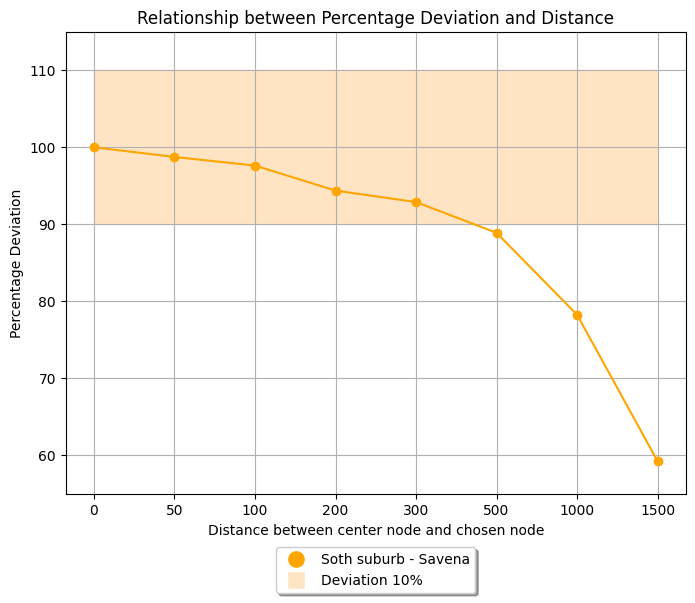

In [35]:
#deviation percentage

df = df_1
# Larger figure size
plt.figure(figsize=(8, 6))
# Plotting
equidistant_x_values = np.linspace(0, len(df['Distance between red chosen node and center node (m)']) - 1, len(df['Distance between red chosen node and center node (m)']))

ex = plt.plot(equidistant_x_values, df_5['Percentage Deviation CN(v)'], marker='o', linestyle='-', color='orange')

# Set x-axis ticks and labels
plt.xticks(equidistant_x_values, df['Distance between red chosen node and center node (m)'])

# Set y-axis limits to emphasize the digression
plt.ylim(55, max(df['Percentage Deviation CN(v)']) + 15)  # Adjust the upper limit as needed

# Add a horizontal line at 100 with a semitransparent pink color
# plt.axhline(y=100, color='pink', linewidth=15, alpha=0.5, label='2% Line', zorder=13)
plt.fill_between(equidistant_x_values, 90, 110, color='bisque')

# Add a legend with a pink square
# legend_elements = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='pink', markersize=10, label='Deviation 2%')]
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=13, label='Soth suburb - Savena'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='bisque', markersize=13, label='Deviation 10%'),
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True)

# Add labels and title
plt.xlabel('Distance between center node and chosen node')
plt.ylabel('Percentage Deviation')
plt.title('Relationship between Percentage Deviation and Distance')
plt.grid(True)

# df_n_nodes = DataFrame({'Area1':df_1['total nodes numebr'], 'Area2':df_2['total nodes numebr'],'Area3':df_3['total nodes numebr'], 'Area4':df_4['total nodes numebr'], 'Area5':df_5['total nodes numebr']})
# df_n_nodes
# df_final = DataFrame({'area1':df_1['Percentage Deviation CN(v)'],'area2':df_2['Percentage Deviation CN(v)'], 'area3':df_3['Percentage Deviation CN(v)'], 'area4':df_4['Percentage Deviation CN(v)'], 'area5':df_5['Percentage Deviation CN(v)']})
# df_final
